In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp '/content/drive/MyDrive/Colab Notebooks/4Course_misc/animal-image-dataset-90-different-animals.zip' /content/

In [ ]:
!unzip -q animal-image-dataset-90-different-animals.zip -d animal-dataset


In [ ]:
import tensorflow as tf

# Тваринки


In [ ]:
import os

base_dir = '/content/animal-dataset/animals/animals'


In [ ]:
animal_species = os.listdir(base_dir)
print(animal_species)

['cow', 'starfish', 'crab', 'antelope', 'jellyfish', 'goose', 'pelecaniformes', 'butterfly', 'dragonfly', 'hornbill', 'kangaroo', 'seahorse', 'beetle', 'woodpecker', 'sandpiper', 'sheep', 'mosquito', 'dolphin', 'tiger', 'deer', 'lobster', 'possum', 'raccoon', 'chimpanzee', 'bee', 'crow', 'hamster', 'caterpillar', 'leopard', 'moth', 'pig', 'panda', 'snake', 'squirrel', 'coyote', 'grasshopper', 'okapi', 'wolf', 'shark', 'sparrow', 'koala', 'donkey', 'whale', 'seal', 'hummingbird', 'squid', 'duck', 'penguin', 'orangutan', 'bison', 'fox', 'zebra', 'otter', 'badger', 'fly', 'rat', 'eagle', 'dog', 'flamingo', 'goat', 'owl', 'reindeer', 'hedgehog', 'cat', 'goldfish', 'ox', 'bat', 'horse', 'turkey', 'bear', 'swan', 'porcupine', 'boar', 'turtle', 'lion', 'ladybugs', 'hyena', 'pigeon', 'lizard', 'wombat', 'gorilla', 'cockroach', 'hippopotamus', 'rhinoceros', 'octopus', 'oyster', 'mouse', 'elephant', 'parrot', 'hare']


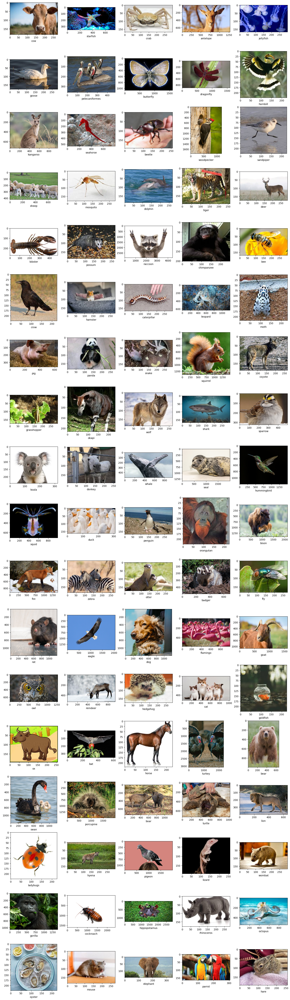

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 18
ncols = 5

# Index for iterating over images
pic_index = 0
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

animal_files = []
for animal in os.listdir(base_dir):
  animal_file_names = os.listdir(os.path.join(base_dir, animal))
  animal_files.append(dict(label=animal, animal_file_paths= [os.path.join(base_dir, animal, animal_file_name) for animal_file_name in animal_file_names]))


for i, animal in enumerate(animal_files):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  img = mpimg.imread(animal['animal_file_paths'][0])
  plt.imshow(img)
  plt.xlabel(animal['label'])

plt.show()

In [ ]:
# Каталог з даними для навчання
train_dir = 'train'
# Каталог з даними для перевірки
val_dir = 'validation'
# Каталог з даними для тестування
test_dir = 'test'

In [ ]:
import os
import shutil
import random

def split_data(input_folder, output_folder, train_proportion, test_proportion, validation_proportion):
    # Create train, test, and validation folders
    train_folder = os.path.join(output_folder, train_dir)
    test_folder = os.path.join(output_folder, test_dir)
    validation_folder = os.path.join(output_folder, val_dir)

    os.makedirs(train_folder, exist_ok=True)
    os.makedirs(test_folder, exist_ok=True)
    os.makedirs(validation_folder, exist_ok=True)

    # Iterate through each class folder
    for class_folder in os.listdir(input_folder):
        class_path = os.path.join(input_folder, class_folder)

        # Get a list of all image files in the class folder
        images = [f for f in os.listdir(class_path) if f.endswith('.jpg')]

        # Shuffle the images randomly
        random.shuffle(images)

        # Calculate the number of images for each split
        total_images = len(images)
        train_size = int(total_images * train_proportion)
        test_size = int(total_images * test_proportion)
        validation_size = int(total_images * validation_proportion)

        # Split the images into train, test, and validation sets
        train_set = images[:train_size]
        test_set = images[train_size:train_size + test_size]
        validation_set = images[train_size + test_size:train_size + test_size + validation_size]

        # Move images to their respective folders
        for image in train_set:
            source_path = os.path.join(class_path, image)
            destination_path = os.path.join(train_folder, class_folder, image)
            os.makedirs(os.path.dirname(destination_path), exist_ok=True)
            shutil.copy(source_path, destination_path)

        for image in test_set:
            source_path = os.path.join(class_path, image)
            destination_path = os.path.join(test_folder, class_folder, image)
            os.makedirs(os.path.dirname(destination_path), exist_ok=True)
            shutil.copy(source_path, destination_path)

        for image in validation_set:
            source_path = os.path.join(class_path, image)
            destination_path = os.path.join(validation_folder, class_folder, image)
            os.makedirs(os.path.dirname(destination_path), exist_ok=True)
            shutil.copy(source_path, destination_path)


In [ ]:
input_folder = base_dir
output_folder = './'
train_proportion = 0.7  # 70% of data for training
test_proportion = 0.15  # 15% of data for testing
validation_proportion = 0.15  # 15% of data for validation

split_data(input_folder, output_folder, train_proportion, test_proportion, validation_proportion)

In [ ]:
batch_size = 25

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

traingen = ImageDataGenerator(preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
                              rotation_range=15,
                              width_shift_range=0.2,
                              height_shift_range=0.2,
                              zoom_range=0.2,
                              horizontal_flip=True,
                              fill_mode='nearest'
                              )

testgen = ImageDataGenerator(preprocessing_function = tf.keras.applications.efficientnet.preprocess_input)

valgen = ImageDataGenerator(preprocessing_function = tf.keras.applications.efficientnet.preprocess_input)

# Flow training images in batches
train_generator = traingen.flow_from_directory(
        train_dir,  # This is the source directory for training images
        target_size=(224, 224),  # All images will be resized to 224x224
        batch_size=batch_size,
        class_mode='categorical')
# Flow validating images in batches
validation_generator = valgen.flow_from_directory(
        val_dir,  # This is the source directory for validating images
        target_size=(224, 224),  # All images will be resized to 224x224
        batch_size=batch_size,
        class_mode='categorical')
# Flow test images in batches
test_generator = testgen.flow_from_directory(
        test_dir,  # This is the source directory for test images
        target_size=(224, 224),  # All images will be resized to 224x224
        batch_size=batch_size,
        class_mode='categorical')

Found 3780 images belonging to 90 classes.
Found 810 images belonging to 90 classes.
Found 810 images belonging to 90 classes.


### Base model

In [ ]:
base_model =  tf.keras.applications.EfficientNetB3(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)

43941136/43941136 [==============================] - 0s 0us/step


In [ ]:
base_model.trainable = False

In [ ]:
num_classes = len(set(train_generator.classes))

model = tf.keras.models.Sequential([
    base_model,
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.35),
    tf.keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 dense (Dense)               (None, 512)               786944    
                                                                 
 batch_normalization (Batch  (None, 512)               2048      
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 90)                46170     
                                                                 
Total params: 11618697 (44.32 MB)
Trainable params: 8341

### Training

In [ ]:
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    validation_data=validation_generator,
    validation_steps=len(validation_generator),
    epochs=15,
    callbacks=[
        EarlyStopping(monitor = "val_loss",
                               patience = 3,
                               restore_best_weights = True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)

Epoch 1/15
152/152 [==============================] - 101s 526ms/step - loss: 1.9146 - accuracy: 0.5807 - val_loss: 0.5527 - val_accuracy: 0.8519 - lr: 5.0000e-04
Epoch 2/15
152/152 [==============================] - 77s 507ms/step - loss: 0.6249 - accuracy: 0.8392 - val_loss: 0.4658 - val_accuracy: 0.8815 - lr: 5.0000e-04
Epoch 3/15
152/152 [==============================] - 75s 494ms/step - loss: 0.4251 - accuracy: 0.8889 - val_loss: 0.3771 - val_accuracy: 0.8889 - lr: 5.0000e-04
Epoch 4/15
152/152 [==============================] - 75s 492ms/step - loss: 0.3293 - accuracy: 0.9108 - val_loss: 0.3483 - val_accuracy: 0.9049 - lr: 5.0000e-04
Epoch 5/15
152/152 [==============================] - 77s 508ms/step - loss: 0.2626 - accuracy: 0.9357 - val_loss: 0.3193 - val_accuracy: 0.9111 - lr: 5.0000e-04
Epoch 6/15
152/152 [==============================] - 74s 489ms/step - loss: 0.2282 - accuracy: 0.9437 - val_loss: 0.3186 - val_accuracy: 0.9111 - lr: 5.0000e-04
Epoch 7/15
152/152 [=======

Text(0, 0.5, 'Loss')

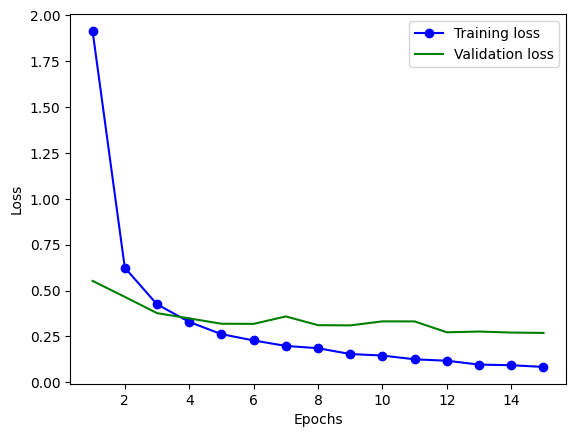

In [ ]:
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)
plt.plot(epochs, loss_values, 'bo-', label='Training loss')
plt.plot(epochs, val_loss_values, 'g', label='Validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')


Text(0, 0.5, 'Accuracy')

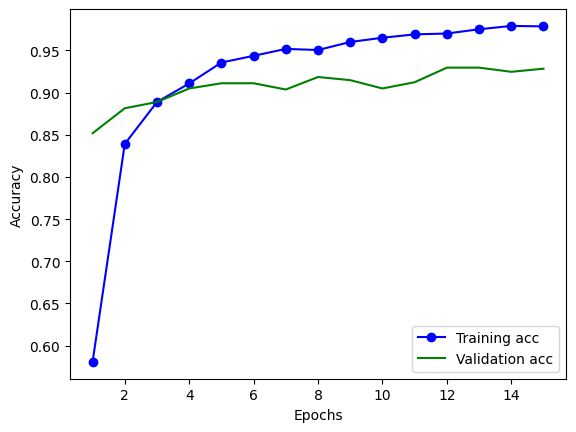

In [ ]:
history_dict = history.history
acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)
plt.plot(epochs, acc_values, 'bo-', label='Training acc')
plt.plot(epochs, val_acc_values, 'g', label='Validation acc')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')


### Оцінка точності навчання

In [ ]:
scores = model.evaluate(test_generator, batch_size = batch_size)

33/33 [==============================] - 6s 190ms/step - loss: 0.2461 - accuracy: 0.9420


In [ ]:
print("Доля правильних відповідей на тестових даних, у відсотках:", round(scores[1] * 100, 4))

Доля правильних відповідей на тестових даних, у відсотках: 94.1975


### Fine tuning

In [ ]:
base_model.trainable = True
for layer in base_model.layers:
    if isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())
history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    validation_data=validation_generator,
    validation_steps=len(validation_generator),
    epochs=15,
    callbacks=[
        EarlyStopping(monitor = "val_loss",
                               patience = 3,
                               restore_best_weights = True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb3 (Functional  (None, 1536)              10783535  
 )                                                               
                                                                 
 dense (Dense)               (None, 512)               786944    
                                                                 
 batch_normalization (Batch  (None, 512)               2048      
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 90)                46170     
                                                                 
Total params: 11618697 (44.32 MB)
Trainable params: 1144

Text(0, 0.5, 'Loss')

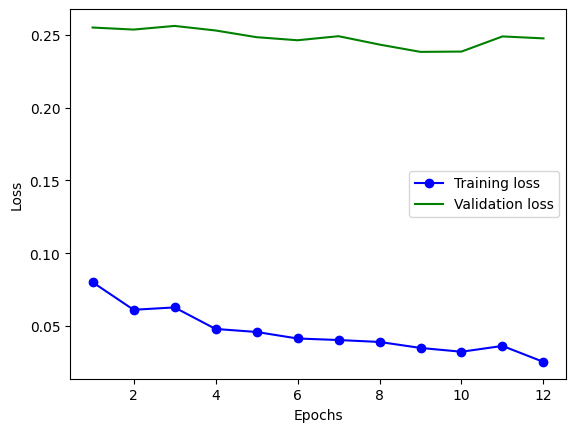

In [ ]:
history_dict = history.history
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
epochs = range(1, len(loss_values) + 1)
plt.plot(epochs, loss_values, 'bo-', label='Training loss')
plt.plot(epochs, val_loss_values, 'g', label='Validation loss')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Loss')


In [ ]:
history_dict = history.history
acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']
epochs = range(1, len(acc_values) + 1)
plt.plot(epochs, acc_values, 'bo-', label='Training acc')
plt.plot(epochs, val_acc_values, 'g', label='Validation acc')
plt.legend()
plt.xlabel('Epochs')
plt.ylabel('Accuracy')


### Оцінка точності навчання

In [ ]:
scores = model.evaluate(test_generator, batch_size = batch_size)

33/33 [==============================] - 5s 155ms/step - loss: 0.2173 - accuracy: 0.9457


In [ ]:
print("Доля правильних відповідей на тестових даних, у відсотках:", round(scores[1] * 100, 4))

Доля правильних відповідей на тестових даних, у відсотках: 94.5679


### Перевірка прогнозування на зображеннях тварин

In [ ]:
import numpy as np
from google.colab import files
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt

uploaded = files.upload()

Saving bee.png to bee.png
Saving butterfly.png to butterfly.png
Saving fox.png to fox.png
Saving hamster.png to hamster.png
Saving hedgehog.png to hedgehog.png
Saving parrot.png to parrot.png
Saving penguin.png to penguin.png
Saving racoon.png to racoon.png
Saving rat.png to rat.png
Saving sheep.png to sheep.png
Saving sparrow.png to sparrow.png
Saving turtle.png to turtle.png


1/1 [==============================] - 0s 28ms/step


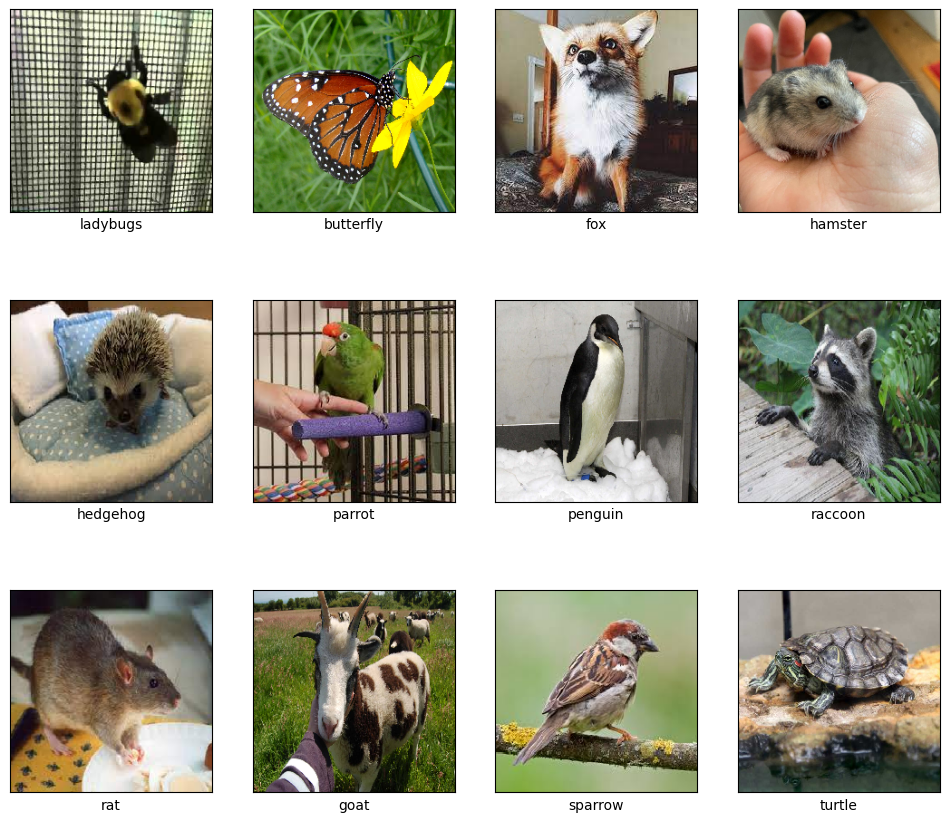

In [ ]:
animal_classes = list(train_generator.class_indices)

plt.figure(figsize=(12,22))
for i, fn in enumerate(uploaded.keys()):
  path = '/content/' + fn
  img = load_img(path, target_size=(224, 224))
  x = img_to_array(img)
  x = np.expand_dims(x, axis=0)
  x = tf.keras.applications.mobilenet_v3.preprocess_input(x)
  preds = model.predict(x)
  predicted_class = np.argmax(preds[0])
  plt.subplot(6,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.grid(False)
  plt.imshow(img)
  plt.xlabel(animal_classes[predicted_class])

### Збереження моделі для розпізнавання та списку порід котиків

In [ ]:
model.save('./animal_species_recognition_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
import pickle

with open('./animal_species_list.pkl', mode='wb') as animal_list_file:
  pickle.dump(animal_classes, animal_list_file)

In [ ]:
!mkdir ./drive/MyDrive/4Course

mkdir: cannot create directory ‘./drive/MyDrive/4Course’: File exists


In [ ]:
!cp ./animal_species_recognition_model.h5 ./drive/MyDrive/4Course
!cp ./animal_species_list.pkl ./drive/MyDrive/4Course